## Hopland Daily no boundary conditions and no upstream subbasins

In [ ]:
run_gridsearch = False
skip_best_model_validation = True
skip_best_model_test = True
testEnsembles = 5
gpuSetting = 0
hyperparam_csv_file = "hopland_daily_subbasins_hyperparams.csv"

In [2]:
import sys
import os
import itertools
current_dir = os.getcwd()
print(current_dir)

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all


In [3]:
library_path = os.path.join('..', '..', '..','..','UCB-USACE-LSTMs')
sys.path.insert(0, library_path)
print(sys.path)

['..\\..\\..\\..\\UCB-USACE-LSTMs', 'F:\\Dino\\UCB-USACE-LSTMs\\UCB_training\\models\\hopland_all', 'C:\\Users\\Dino\\anaconda3\\python312.zip', 'C:\\Users\\Dino\\anaconda3\\DLLs', 'C:\\Users\\Dino\\anaconda3\\Lib', 'C:\\Users\\Dino\\anaconda3', '', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages\\win32', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages\\win32\\lib', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages\\Pythonwin']


In [4]:
from pathlib import Path
from neuralhydrology.evaluation.metrics import *
from UCB_training.UCB_train import UCB_trainer
from UCB_training.UCB_utils import combinedPlot
from UCB_training.UCB_utils import fancyCombinedPlot
from UCB_training.UCB_utils import combinedPlotFromDf
from UCB_training.UCB_utils import fancyCombinedPlotFromDf

In [5]:
# Dynamically find the repo root from the current working directory
current_path = os.getcwd()
library_path = current_path.split('UCB-USACE-LSTMs')[0] + 'UCB-USACE-LSTMs'

# Construct the target path
target_path = os.path.join(library_path, 'UCB_training', 'models', 'hopland_all')

# Verify if the directory exists before changing
if os.path.exists(target_path):
    os.chdir(target_path)
    print("Current Working Directory:", os.getcwd())
    print("Train Basin File Exists:", os.path.exists("hopland")) #each basin has its own train basin file, so change for different basins e.g "guerneville", etc.
else:
    print(f"Error: The target path '{target_path}' does not exist.")

Current Working Directory: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all
Train Basin File Exists: True


In [6]:
path_to_csv = Path(library_path +'/russian_river_data')
path_to_yaml = Path("hopland_gage_subbasins.yaml") #update the yaml file for different basins
path_to_physics_data = Path(library_path + "/russian_river_data/Hopland_daily.csv")

In [7]:
features_with_physics = [
    #from daily.csv
    "RUSSIAN 60 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 60 PRECIP-INC SCREENED",
    "RUSSIAN 70 PRECIP-INC SCREENED",
    "RUSSIAN 70 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "WF RUSSIAN PRECIP-INC SCREENED",
    "WF RUSSIAN ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    #from hopland.csv
    'Hopland Gage FLOW',
    'Russian 60 ET-POTENTIAL',
    'Russian 60 FLOW',
    'Russian 60 FLOW-BASE',
    'Russian 60 INFILTRATION',
    'Russian 60 PERC-SOIL',
    'Russian 60 SATURATION FRACTION',
    'Russian 70 ET-POTENTIAL',
    'Russian 70 FLOW',
    'Russian 70 FLOW-BASE',
    'Russian 70 INFILTRATION',
    'Russian 70 PERC-SOIL',
    'Russian 70 SATURATION FRACTION',
    'WF Russian ET-POTENTIAL',
    'WF Russian FLOW',
    'WF Russian FLOW-BASE',
    'WF Russian INFILTRATION',
    'WF Russian PERC-SOIL',
    'WF Russian SATURATION FRACTION',
    "UKIAH CA HUMIDITY USAF-NOAA",
    "UKIAH CA SOLAR RADIATION USAF-NOAA",
    "UKIAH CA TEMPERATURE USAF-NOAA",
    "UKIAH CA WINDSPEED USAF-NOAA",
    # "UKIAH CA FLOW USGS-MERGED",
    #"Lake Mendocino Storage",    
]

In [8]:
hyperparam_space = {
    "hidden_size": [128, 256],
    "seq_length": [90, 180],
    "num_layers": [1],
    "epochs": [16, 32]
}
fixed_dropout = 0.4
no_physics_results = []
physics_results = []

NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:49:07,280: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184907\output.log initialized.
2025-04-16 18:49:07,280: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184907
2025-04-16 18:49:07,280: ### Run configurations for testing_run
2025-04-16 18:49:07,280: experiment_name: testing_run
2025-04-16 18:49:07,280: train_basin_file: hopland
2025-04-16 18:49:07,296: validation_basin_file: hopland
2025-04-16 18:49:07,296: test_basin_file: hopland
2025-04-16 18:49:07,296: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:49:07,296: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:49:07,296: validation_start_date: 2002-10-01 00:00:00
2025-04-16 18:49:07,296: validation_end_date: 2005-09-30 00:00:00
2025-04-16 18:49:07,311: test_star

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]
2025-04-16 18:49:27,497: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184907\validation\model_epoch016\validation_metrics.csv
2025-04-16 18:49:27,513: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184907\validation\model_epoch016\validation_results.p
got predictions


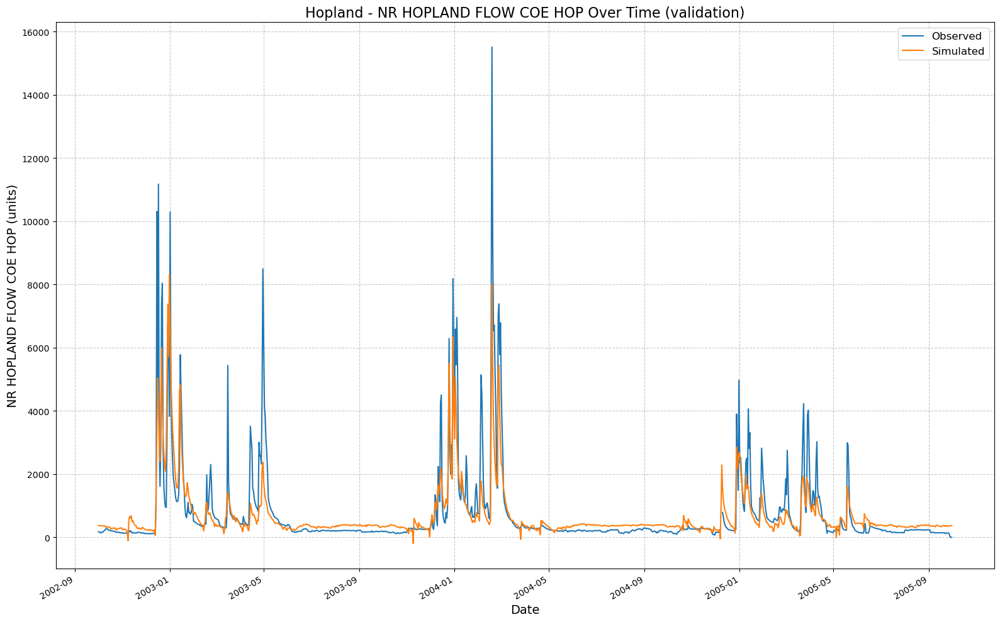

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184907\results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:49:28,356: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184928\output.log initialized.
2025-04-16 18:49:28,356: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184928
2025-04-16 18:49:28,356: ### Run configurations for testing_run
2025-04-16 18:49:28,356: experiment_name: testing_run
2025-04-16 18:49:28,356: train_basin_file: hopland
2025-04-16 18:49:28,372: validation_basin_file: hopland
2025-04-16 18:49:28,372: test_basin_file: hopland
2025-04-16 18:49:28,372: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:49:28,372: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:49:28,372: 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.37it/s]
2025-04-16 18:49:28,731: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<?, ?it/s]
2025-04-16 18:49:28,747: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.90it/s, Loss: 0.0000]
2025-04-16 18:49:30,139: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 16.00it/s, Loss: 0.0000]
2025-04-16 18:49:30,842: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 16.01it/s, Loss: 0.0000]
2025-04-16 18:49:31,545: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 16.00it/s, Loss: 0.0000]
2025-04-16 18:49:32,232: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 16.00it/s, Loss: 0.0000]
2025-04-16 18:49:32,920: Epoch 5 average loss: a

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]
2025-04-16 18:49:56,123: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184928\validation\model_epoch032\validation_metrics.csv
2025-04-16 18:49:56,123: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184928\validation\model_epoch032\validation_results.p
got predictions


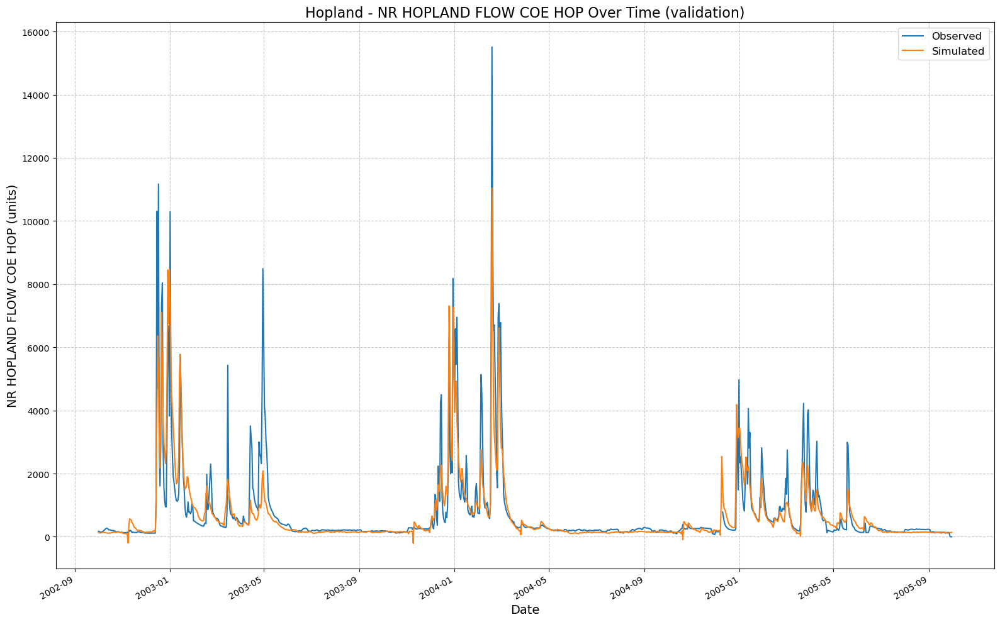

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184928\results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:49:56,748: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184956\output.log initialized.
2025-04-16 18:49:56,763: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184956
2025-04-16 18:49:56,763: ### Run configurations for testing_run
2025-04-16 18:49:56,763: experiment_name: testing_run
2025-04-16 18:49:56,763: train_basin_file: hopland
2025-04-16 18:49:56,763: validation_basin_file: hopland
2025-04-16 18:49:56,763: test_basin_file: hopland
2025-04-16 18:49:56,763: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:49:56,763: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:49:56,763:

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.05it/s]
2025-04-16 18:49:57,170: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 64.45it/s]
2025-04-16 18:49:57,185: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.91it/s, Loss: 0.0000]
2025-04-16 18:49:58,561: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00, 10.06it/s, Loss: 0.0000]
2025-04-16 18:49:59,670: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.64it/s, Loss: 0.0000]
2025-04-16 18:50:00,826: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00, 10.05it/s, Loss: 0.0000]
2025-04-16 18:50:01,936: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.92it/s, Loss: 0.0000]
2025-04-16 18:50:03,061: Epoch 5 average

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]
2025-04-16 18:50:18,123: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184956\validation\model_epoch016\validation_metrics.csv
2025-04-16 18:50:18,123: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184956\validation\model_epoch016\validation_results.p
got predictions


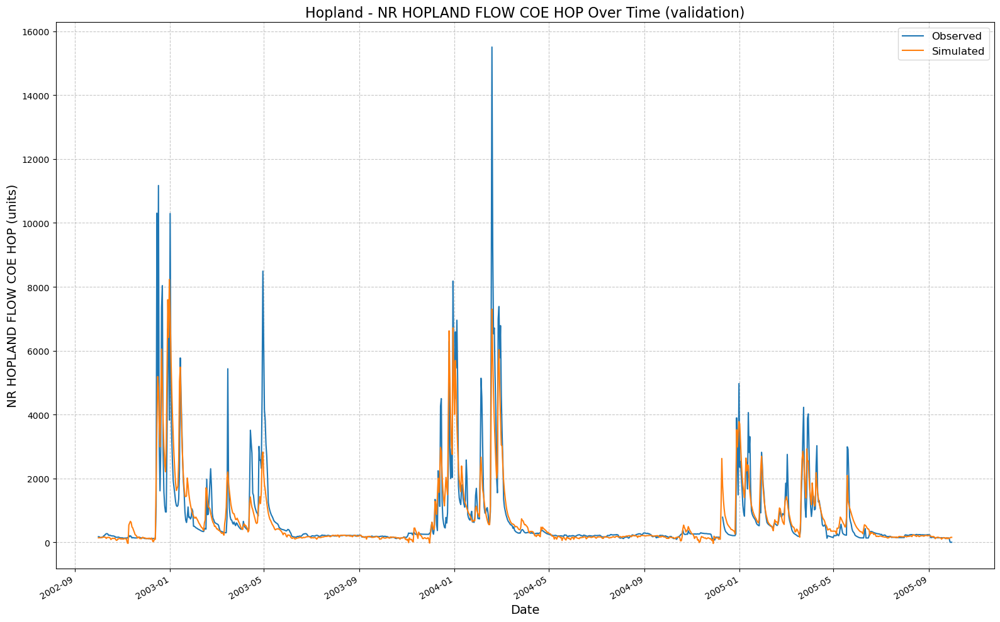

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_184956\results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:50:18,889: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185018\output.log initialized.
2025-04-16 18:50:18,904: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185018
2025-04-16 18:50:18,904: ### Run configurations for testing_run
2025-04-16 18:50:18,904: experiment_name: testing_run
2025-04-16 18:50:18,904: train_basin_file: hopland
2025-04-16 18:50:18,904: validation_basin_file: hopland
2025-04-16 18:50:18,904: test_basin_file: hopland
2025-04-16 18:50:18,920: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:50:18,920: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:50:18,920:

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  4.00it/s]
2025-04-16 18:50:19,232: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 64.04it/s]
2025-04-16 18:50:19,263: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.77it/s, Loss: 0.0000]
2025-04-16 18:50:20,655: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00, 10.35it/s, Loss: 0.0000]
2025-04-16 18:50:21,733: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.78it/s, Loss: 0.0000]
2025-04-16 18:50:22,857: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.78it/s, Loss: 0.0000]
2025-04-16 18:50:23,998: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00, 10.21it/s, Loss: 0.0000]
2025-04-16 18:50:25,076: Epoch 5 average

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]
2025-04-16 18:51:00,151: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185018\validation\model_epoch032\validation_metrics.csv
2025-04-16 18:51:00,151: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185018\validation\model_epoch032\validation_results.p
got predictions


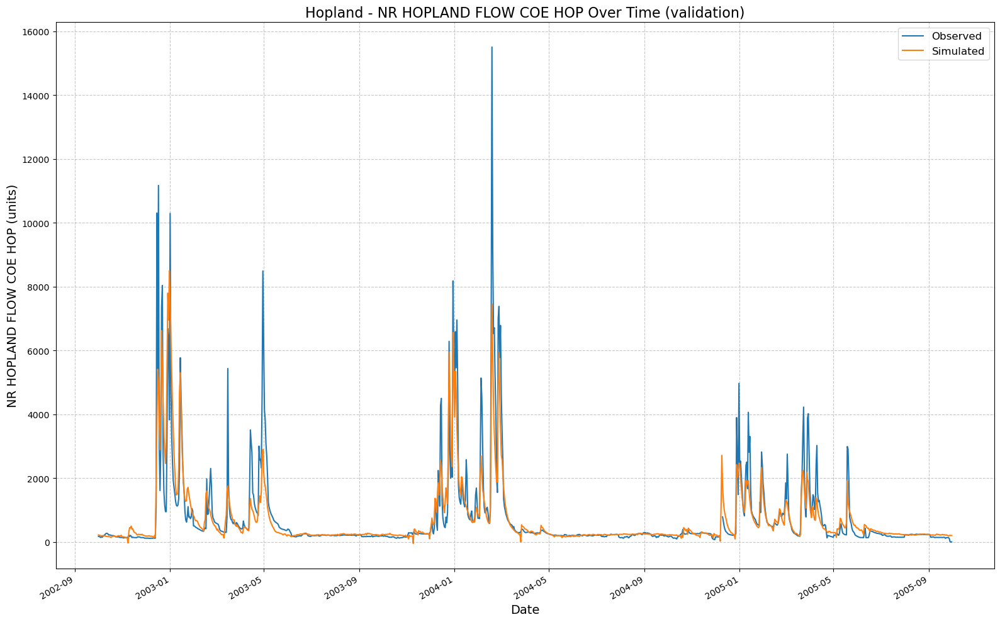

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185018\results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:51:00,994: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185100\output.log initialized.
2025-04-16 18:51:00,994: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185100
2025-04-16 18:51:00,994: ### Run configurations for testing_run
2025-04-16 18:51:00,994: experiment_name: testing_run
2025-04-16 18:51:00,994: train_basin_file: hopland
2025-04-16 18:51:01,010: validation_basin_file: hopland
2025-04-16 18:51:01,010: test_basin_file: hopland
2025-04-16 18:51:01,010: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:51:01,010: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:51:01,010: 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]
2025-04-16 18:51:16,960: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185100\validation\model_epoch016\validation_metrics.csv
2025-04-16 18:51:16,960: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185100\validation\model_epoch016\validation_results.p
got predictions


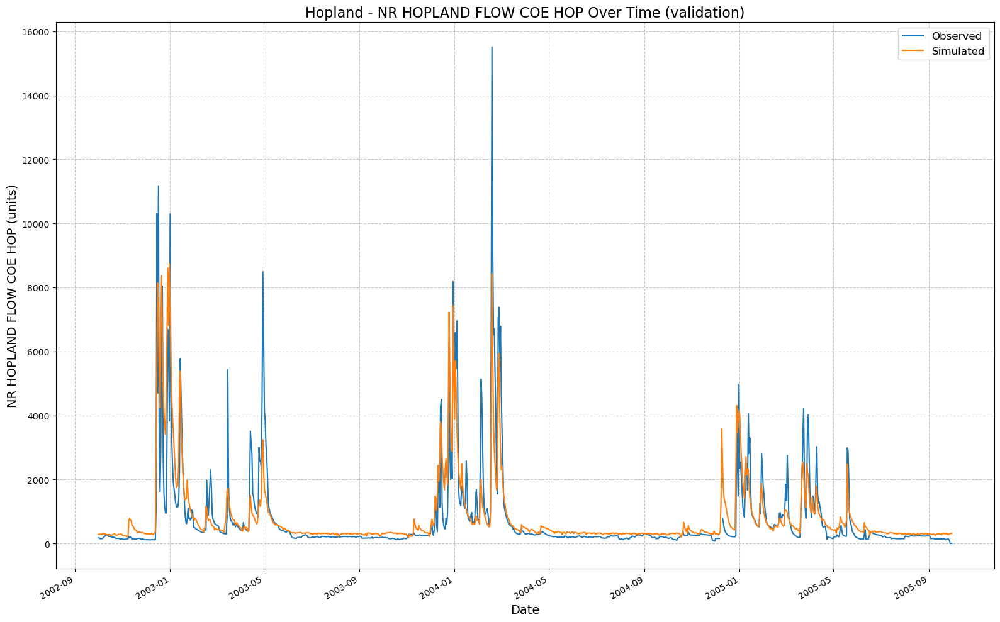

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185100\results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:51:17,882: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185117\output.log initialized.
2025-04-16 18:51:17,882: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185117
2025-04-16 18:51:17,882: ### Run configurations for testing_run
2025-04-16 18:51:17,897: experiment_name: testing_run
2025-04-16 18:51:17,897: train_basin_file: hopland
2025-04-16 18:51:17,897: validation_basin_file: hopland
2025-04-16 18:51:17,897: test_basin_file: hopland
2025-04-16 18:51:17,897: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:51:17,897: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:51:17,897: 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


2025-04-16 18:51:17,944: data_dir: F:\Dino\UCB-USACE-LSTMs\russian_river_data
2025-04-16 18:51:17,944: dynamic_inputs: ['RUSSIAN 60 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR', 'RUSSIAN 60 PRECIP-INC SCREENED', 'RUSSIAN 70 PRECIP-INC SCREENED', 'RUSSIAN 70 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR', 'WF RUSSIAN PRECIP-INC SCREENED', 'WF RUSSIAN ET-POTENTIAL RUN:BASIN AVERAGE 60 YR', 'UKIAH CA HUMIDITY USAF-NOAA', 'UKIAH CA SOLAR RADIATION USAF-NOAA', 'UKIAH CA TEMPERATURE USAF-NOAA', 'UKIAH CA WINDSPEED USAF-NOAA']
2025-04-16 18:51:17,944: target_variables: ['NR HOPLAND FLOW COE HOP']
2025-04-16 18:51:17,944: hourly: False
2025-04-16 18:51:17,944: number_of_basins: 1
2025-04-16 18:51:17,944: run_dir: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185117
2025-04-16 18:51:17,944: train_dir: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185117\train_data
2025-04-16 18:51:17,944: img_log_dir: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\ho

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]
2025-04-16 18:51:47,919: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185117\validation\model_epoch032\validation_metrics.csv
2025-04-16 18:51:47,935: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185117\validation\model_epoch032\validation_results.p
got predictions


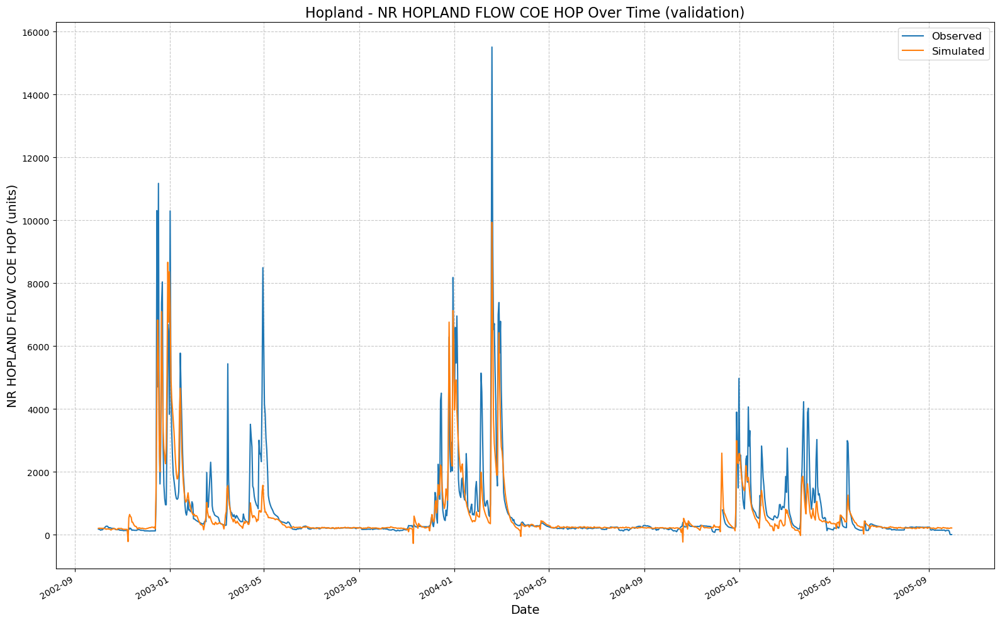

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185117\results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:51:48,669: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185148\output.log initialized.
2025-04-16 18:51:48,669: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185148
2025-04-16 18:51:48,669: ### Run configurations for testing_run
2025-04-16 18:51:48,685: experiment_name: testing_run
2025-04-16 18:51:48,685: train_basin_file: hopland
2025-04-16 18:51:48,685: validation_basin_file: hopland
2025-04-16 18:51:48,685: test_basin_file: hopland
2025-04-16 18:51:48,685: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:51:48,685: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:51:48,685:

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


2025-04-16 18:51:48,716: predict_last_n: 1
2025-04-16 18:51:48,732: seq_length: 180
2025-04-16 18:51:48,732: log_interval: 16
2025-04-16 18:51:48,732: log_tensorboard: True
2025-04-16 18:51:48,732: log_n_figures: 1
2025-04-16 18:51:48,732: save_weights_every: 16
2025-04-16 18:51:48,732: dataset: russian_river
2025-04-16 18:51:48,732: data_dir: F:\Dino\UCB-USACE-LSTMs\russian_river_data
2025-04-16 18:51:48,732: dynamic_inputs: ['RUSSIAN 60 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR', 'RUSSIAN 60 PRECIP-INC SCREENED', 'RUSSIAN 70 PRECIP-INC SCREENED', 'RUSSIAN 70 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR', 'WF RUSSIAN PRECIP-INC SCREENED', 'WF RUSSIAN ET-POTENTIAL RUN:BASIN AVERAGE 60 YR', 'UKIAH CA HUMIDITY USAF-NOAA', 'UKIAH CA SOLAR RADIATION USAF-NOAA', 'UKIAH CA TEMPERATURE USAF-NOAA', 'UKIAH CA WINDSPEED USAF-NOAA']
2025-04-16 18:51:48,732: target_variables: ['NR HOPLAND FLOW COE HOP']
2025-04-16 18:51:48,732: hourly: False
2025-04-16 18:51:48,732: number_of_basins: 1
2025-04-16 18:51:48,747:

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]
2025-04-16 18:52:14,059: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185148\validation\model_epoch016\validation_metrics.csv
2025-04-16 18:52:14,059: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185148\validation\model_epoch016\validation_results.p
got predictions


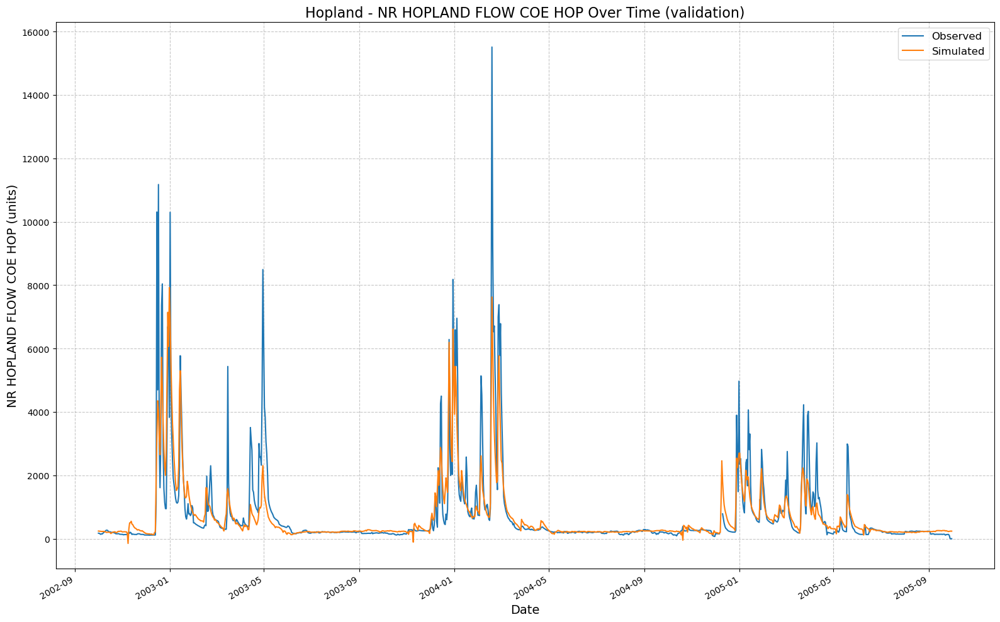

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185148\results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:52:14,840: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185214\output.log initialized.
2025-04-16 18:52:14,856: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185214
2025-04-16 18:52:14,856: ### Run configurations for testing_run
2025-04-16 18:52:14,856: experiment_name: testing_run
2025-04-16 18:52:14,856: train_basin_file: hopland
2025-04-16 18:52:14,856: validation_basin_file: hopland
2025-04-16 18:52:14,856: test_basin_file: hopland
2025-04-16 18:52:14,856: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:52:14,856: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:52:14,856:

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.37it/s]
2025-04-16 18:52:15,246: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 64.04it/s]
2025-04-16 18:52:15,262: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.19it/s, Loss: 0.0000]
2025-04-16 18:52:16,918: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.38it/s, Loss: 0.0000]
2025-04-16 18:52:18,230: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.59it/s, Loss: 0.0000]
2025-04-16 18:52:19,511: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.69it/s, Loss: 0.0000]
2025-04-16 18:52:20,792: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.38it/s, Loss: 0.0000]
2025-04-16 18:52:22,104: Epoch 5 average

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]
2025-04-16 18:53:03,712: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185214\validation\model_epoch032\validation_metrics.csv
2025-04-16 18:53:03,712: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185214\validation\model_epoch032\validation_results.p
got predictions


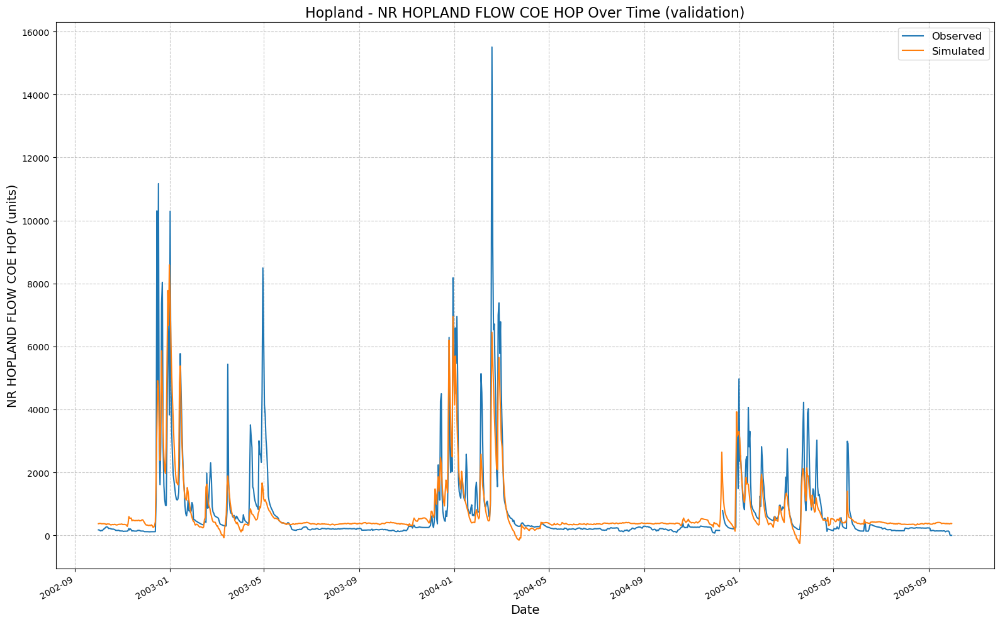

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185214\results_output_validation.csv


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [9]:
if run_gridsearch or not os.path.exists(hyperparam_csv_file):
    for (hs, seq, nl, ep) in itertools.product(
            hyperparam_space["hidden_size"],
            hyperparam_space["seq_length"],
            hyperparam_space["num_layers"],
            hyperparam_space["epochs"]
    ):
        hp = {
            "hidden_size": hs,
            "seq_length": seq,
            "num_layers": nl,
            "epochs": ep,
            "output_dropout": fixed_dropout,
        }
        print(f"NoPhysics: {hp}")
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=hp,
            input_features=None,
            physics_informed=False,
            physics_data_file=None,
            hourly=False,
            extend_train_period=False,
            gpu=gpuSetting
        )
        trainer.train()
        csv_path, metrics_dict = trainer.results()
        row_data = {"hidden_size": hs, "seq_length": seq, "num_layers": nl, "epochs": ep, "output_dropout": fixed_dropout}
        for k, v in metrics_dict.items():
            row_data[k] = v
        no_physics_results.append(row_data)
    df_no_physics = pd.DataFrame(no_physics_results)
    df_no_physics.sort_values(by="NSE", ascending=False, inplace=True)
    df_no_physics.reset_index(drop=True, inplace=True)
else:
    print("Skipping Grid-Search")

Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:53:04,842: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185304\output.log initialized.
2025-04-16 18:53:04,842: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185304
2025-04-16 18:53:04,857: ### Run configurations for testing_run
2025-04-16 18:53:04,857: experiment_name: testing_run
2025-04-16 18:53:04,857: train_basin_file: hopland
2025-04-16 18:53:04,857: validation_basin_file: hopland
2025-04-16 18:53:04,857: test_basin_file: hopland
2025-04-16 18:53:04,857: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:53:04,857: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:53:04,857: validation_start_date: 2002-10-01 00:00:00
2025-04-16 18:53:04,857: validation_end_date: 2005-09-30 00:00:00
2025-04-16 18:53:04,873: test_start_

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]
2025-04-16 18:53:20,542: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185304\validation\model_epoch016\validation_metrics.csv
2025-04-16 18:53:20,542: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185304\validation\model_epoch016\validation_results.p
got predictions


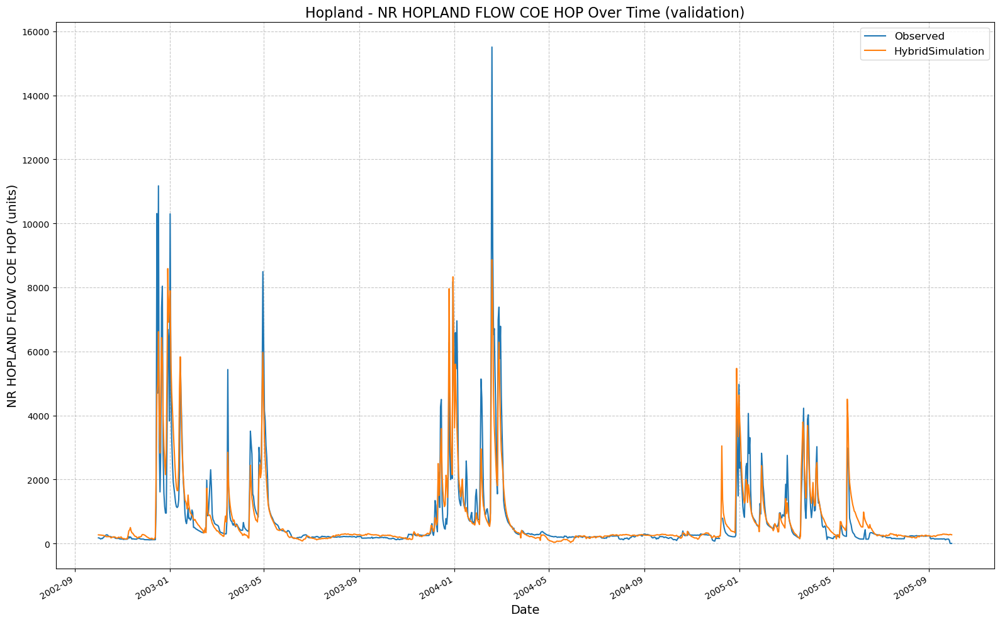

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185304\results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:53:21,276: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185321\output.log initialized.
2025-04-16 18:53:21,276: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185321
2025-04-16 18:53:21,276: ### Run configurations for testing_run
2025-04-16 18:53:21,276: experiment_name: testing_run
2025-04-16 18:53:21,276: train_basin_file: hopland
2025-04-16 18:53:21,276: validation_basin_file: hopland
2025-04-16 18:53:21,291: test_basin_file: hopland
2025-04-16 18:53:21,291: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:53:21,291: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:53:21,291: va

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  1.68it/s]
2025-04-16 18:53:21,979: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<?, ?it/s]
2025-04-16 18:53:22,010: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 17.60it/s, Loss: 0.0000]
2025-04-16 18:53:23,010: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 16.77it/s, Loss: 0.0000]
2025-04-16 18:53:23,682: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 18.05it/s, Loss: 0.0000]
2025-04-16 18:53:24,307: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 17.17it/s, Loss: 0.0000]
2025-04-16 18:53:24,963: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 16.00it/s, Loss: 0.0000]
2025-04-16 18:53:25,650: Epoch 5 average loss: a

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]
2025-04-16 18:53:50,419: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185321\validation\model_epoch032\validation_metrics.csv
2025-04-16 18:53:50,419: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185321\validation\model_epoch032\validation_results.p
got predictions


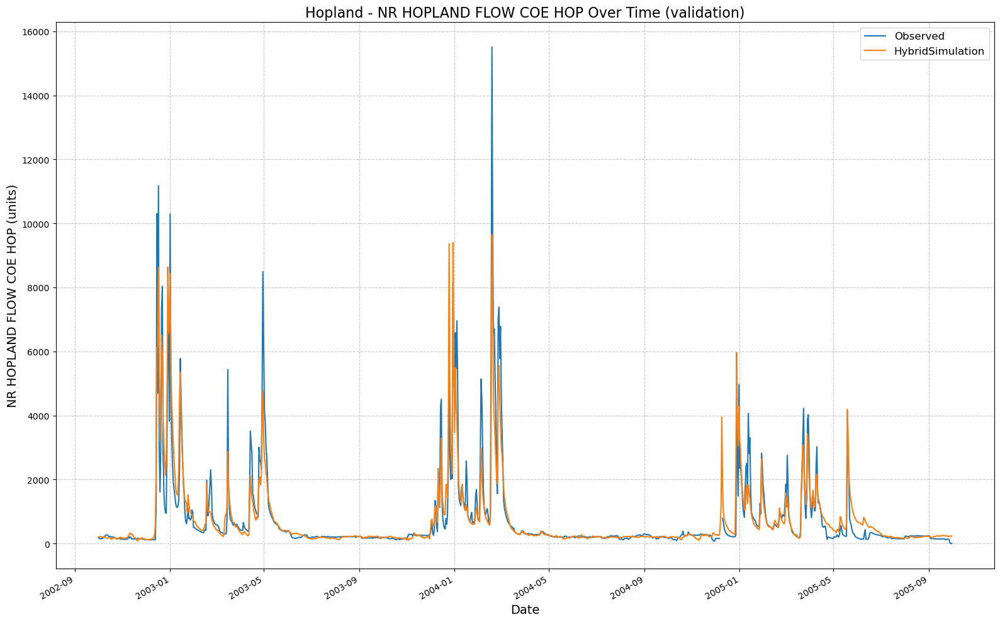

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185321\results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:53:51,247: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185351\output.log initialized.
2025-04-16 18:53:51,247: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185351
2025-04-16 18:53:51,247: ### Run configurations for testing_run
2025-04-16 18:53:51,247: experiment_name: testing_run
2025-04-16 18:53:51,247: train_basin_file: hopland
2025-04-16 18:53:51,247: validation_basin_file: hopland
2025-04-16 18:53:51,263: test_basin_file: hopland
2025-04-16 18:53:51,263: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:53:51,263: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:53:51,263: v

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.06it/s]
2025-04-16 18:53:51,825: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<?, ?it/s]
2025-04-16 18:53:51,856: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.27it/s, Loss: 0.0000]
2025-04-16 18:53:53,418: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.78it/s, Loss: 0.0000]
2025-04-16 18:53:54,543: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00, 10.35it/s, Loss: 0.0000]
2025-04-16 18:53:55,606: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00, 10.20it/s, Loss: 0.0000]
2025-04-16 18:53:56,699: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00, 10.06it/s, Loss: 0.0000]
2025-04-16 18:53:57,808: Epoch 5 average loss: a

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]
2025-04-16 18:54:13,524: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185351\validation\model_epoch016\validation_metrics.csv
2025-04-16 18:54:13,524: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185351\validation\model_epoch016\validation_results.p
got predictions


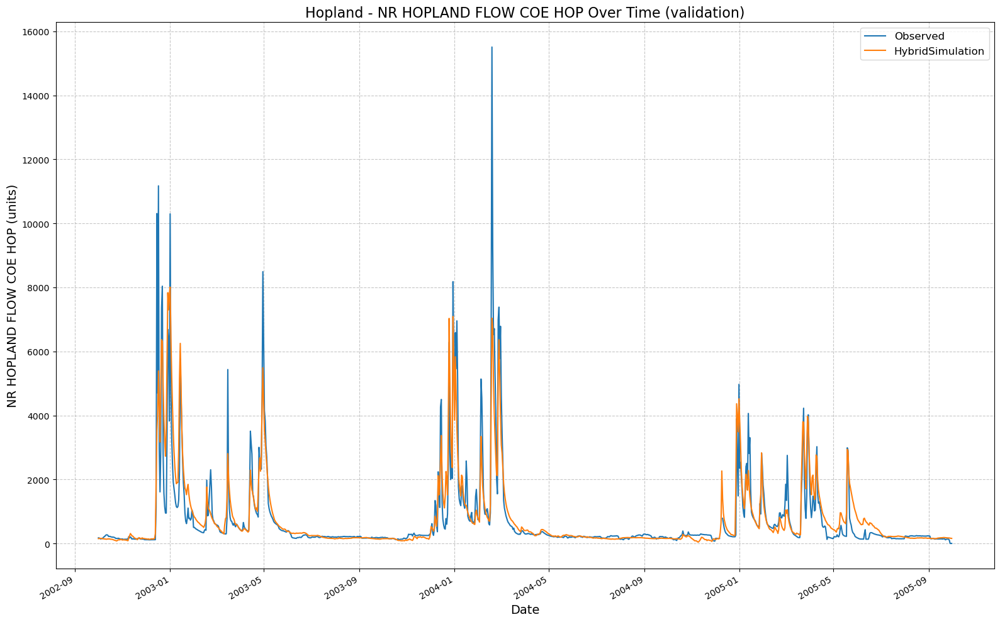

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185351\results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:54:14,211: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185414\output.log initialized.
2025-04-16 18:54:14,211: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185414
2025-04-16 18:54:14,211: ### Run configurations for testing_run
2025-04-16 18:54:14,211: experiment_name: testing_run
2025-04-16 18:54:14,211: train_basin_file: hopland
2025-04-16 18:54:14,211: validation_basin_file: hopland
2025-04-16 18:54:14,211: test_basin_file: hopland
2025-04-16 18:54:14,211: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:54:14,211: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:54:14,227: v

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]
2025-04-16 18:54:14,852: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<?, ?it/s]
2025-04-16 18:54:14,883: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.65it/s, Loss: 0.0000]
2025-04-16 18:54:16,429: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.52it/s, Loss: 0.0000]
2025-04-16 18:54:17,586: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.52it/s, Loss: 0.0000]
2025-04-16 18:54:18,757: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.78it/s, Loss: 0.0000]
2025-04-16 18:54:19,898: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.65it/s, Loss: 0.0000]
2025-04-16 18:54:21,069: Epoch 5 average loss: a

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]
2025-04-16 18:54:58,059: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185414\validation\model_epoch032\validation_metrics.csv
2025-04-16 18:54:58,059: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185414\validation\model_epoch032\validation_results.p
got predictions


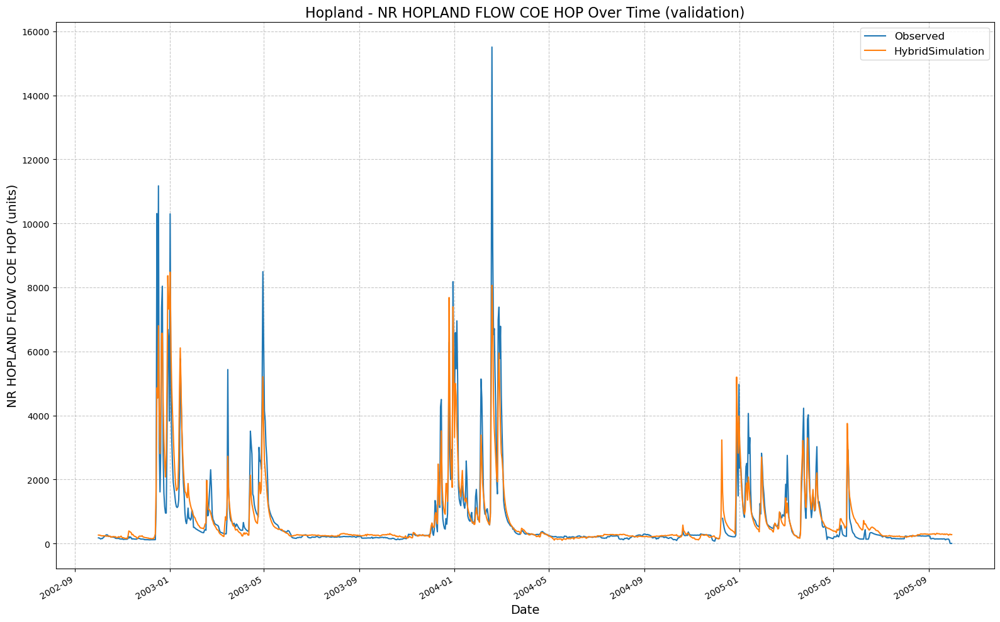

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185414\results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:54:58,761: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185458\output.log initialized.
2025-04-16 18:54:58,761: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185458
2025-04-16 18:54:58,761: ### Run configurations for testing_run
2025-04-16 18:54:58,761: experiment_name: testing_run
2025-04-16 18:54:58,761: train_basin_file: hopland
2025-04-16 18:54:58,761: validation_basin_file: hopland
2025-04-16 18:54:58,777: test_basin_file: hopland
2025-04-16 18:54:58,777: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:54:58,777: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:54:58,777: va

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]
2025-04-16 18:54:59,464: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<?, ?it/s]
2025-04-16 18:54:59,496: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 15.31it/s, Loss: 0.0000]
2025-04-16 18:55:00,511: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 15.31it/s, Loss: 0.0000]
2025-04-16 18:55:01,245: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 14.67it/s, Loss: 0.0000]
2025-04-16 18:55:02,011: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 12.80it/s, Loss: 0.0000]
2025-04-16 18:55:02,870: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 14.08it/s, Loss: 0.0000]
2025-04-16 18:55:03,651: Epoch 5 average loss: a

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]
2025-04-16 18:55:15,559: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185458\validation\model_epoch016\validation_metrics.csv
2025-04-16 18:55:15,575: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185458\validation\model_epoch016\validation_results.p
got predictions


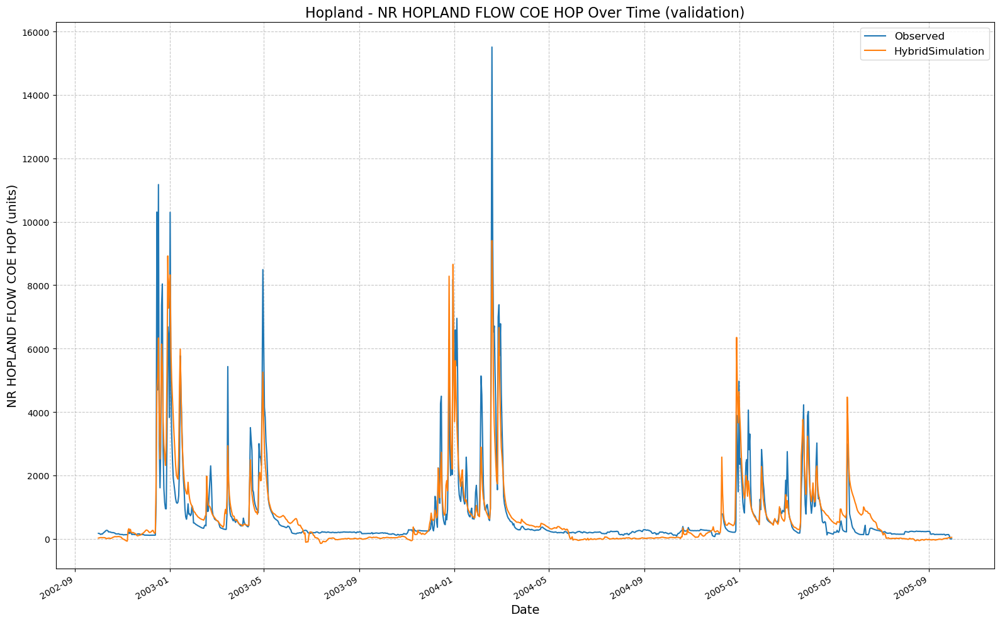

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185458\results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:55:16,184: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185516\output.log initialized.
2025-04-16 18:55:16,184: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185516
2025-04-16 18:55:16,184: ### Run configurations for testing_run
2025-04-16 18:55:16,184: experiment_name: testing_run
2025-04-16 18:55:16,184: train_basin_file: hopland
2025-04-16 18:55:16,184: validation_basin_file: hopland
2025-04-16 18:55:16,199: test_basin_file: hopland
2025-04-16 18:55:16,199: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:55:16,199: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:55:16,199: va

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.13it/s]
2025-04-16 18:55:16,762: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<?, ?it/s]
2025-04-16 18:55:16,793: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 13.81it/s, Loss: 0.0000]
2025-04-16 18:55:17,949: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 13.54it/s, Loss: 0.0000]
2025-04-16 18:55:18,777: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 13.81it/s, Loss: 0.0000]
2025-04-16 18:55:19,589: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 13.81it/s, Loss: 0.0000]
2025-04-16 18:55:20,402: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 13.54it/s, Loss: 0.0000]
2025-04-16 18:55:21,230: Epoch 5 average loss: a

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]
2025-04-16 18:55:47,951: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185516\validation\model_epoch032\validation_metrics.csv
2025-04-16 18:55:47,951: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185516\validation\model_epoch032\validation_results.p
got predictions


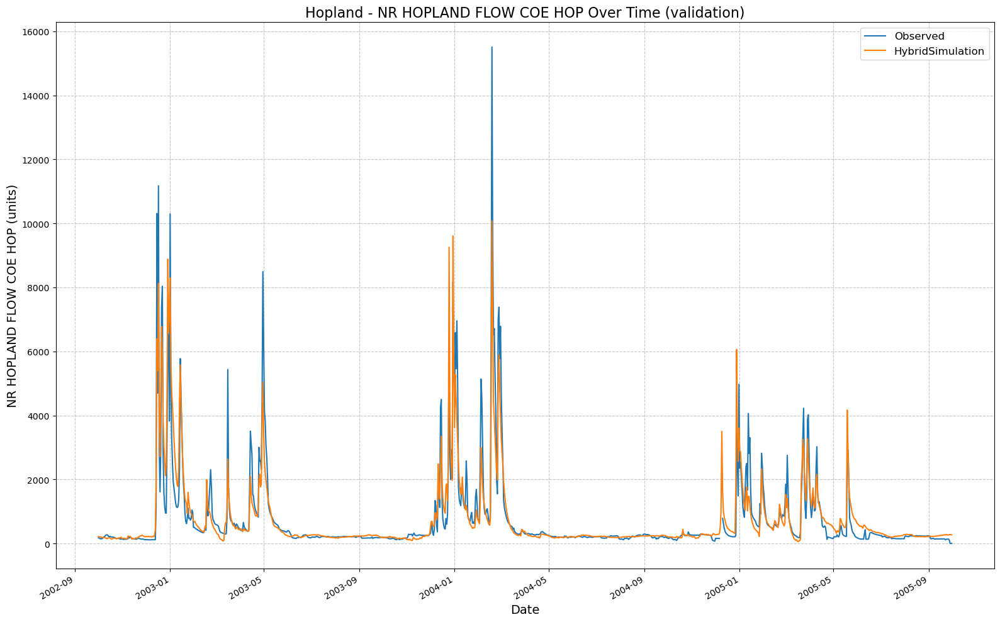

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185516\results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:55:48,560: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185548\output.log initialized.
2025-04-16 18:55:48,560: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185548
2025-04-16 18:55:48,560: ### Run configurations for testing_run
2025-04-16 18:55:48,560: experiment_name: testing_run
2025-04-16 18:55:48,576: train_basin_file: hopland
2025-04-16 18:55:48,576: validation_basin_file: hopland
2025-04-16 18:55:48,576: test_basin_file: hopland
2025-04-16 18:55:48,576: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:55:48,576: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:55:48,576: v

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.00it/s]
2025-04-16 18:55:49,154: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 64.01it/s]
2025-04-16 18:55:49,185: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.82it/s, Loss: 0.0000]
2025-04-16 18:55:50,935: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.00it/s, Loss: 0.0000]
2025-04-16 18:55:52,310: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.00it/s, Loss: 0.0000]
2025-04-16 18:55:53,701: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.00it/s, Loss: 0.0000]
2025-04-16 18:55:55,091: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.19it/s, Loss: 0.0000]
2025-04-16 18:55:56,450: Epoch 5 average

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]
2025-04-16 18:56:14,900: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185548\validation\model_epoch016\validation_metrics.csv
2025-04-16 18:56:14,900: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185548\validation\model_epoch016\validation_results.p
got predictions


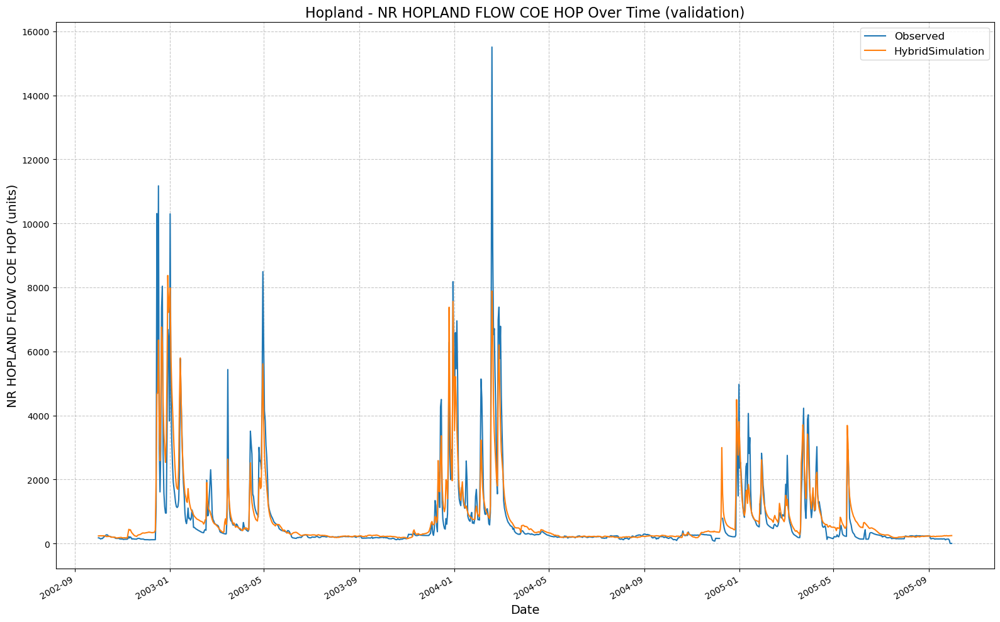

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185548\results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4}
[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:56:15,728: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185615\output.log initialized.
2025-04-16 18:56:15,728: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185615
2025-04-16 18:56:15,743: ### Run configurations for testing_run
2025-04-16 18:56:15,743: experiment_name: testing_run
2025-04-16 18:56:15,743: train_basin_file: hopland
2025-04-16 18:56:15,743: validation_basin_file: hopland
2025-04-16 18:56:15,743: test_basin_file: hopland


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


2025-04-16 18:56:15,743: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:56:15,759: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:56:15,759: validation_start_date: 2002-10-01 00:00:00
2025-04-16 18:56:15,759: validation_end_date: 2005-09-30 00:00:00
2025-04-16 18:56:15,759: test_start_date: 2005-10-01 00:00:00
2025-04-16 18:56:15,759: test_end_date: 2009-09-29 00:00:00
2025-04-16 18:56:15,775: device: cuda:0
2025-04-16 18:56:15,775: physics_informed: True
2025-04-16 18:56:15,775: physics_data_file: F:\Dino\UCB-USACE-LSTMs\russian_river_data\Hopland_daily.csv
2025-04-16 18:56:15,775: validate_every: 5
2025-04-16 18:56:15,775: validate_n_random_basins: 1
2025-04-16 18:56:15,775: metrics: ['NSE', 'MSE']
2025-04-16 18:56:15,790: model: cudalstm
2025-04-16 18:56:15,790: head: regression
2025-04-16 18:56:15,790: output_activation: linear
2025-04-16 18:56:15,790: hidden_size: 256
2025-04-16 18:56:15,790: initial_forget_bias: 3
2025-04-16 18:56:15,790: output_dropout: 0.4
2025-04-16 18

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]
2025-04-16 18:57:06,746: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185615\validation\model_epoch032\validation_metrics.csv
2025-04-16 18:57:06,746: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185615\validation\model_epoch032\validation_results.p
got predictions


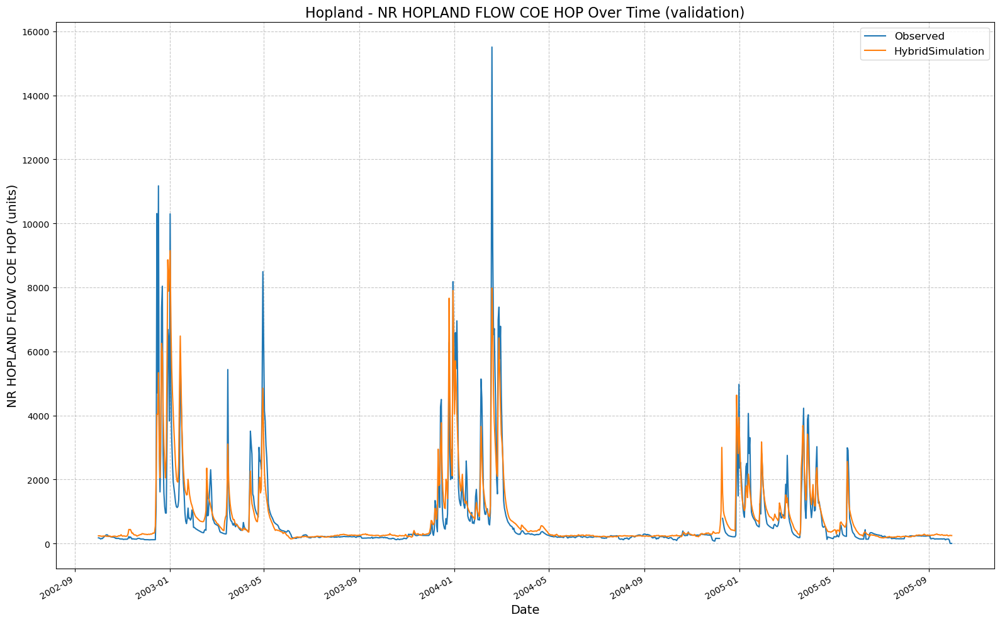

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185615\results_output_validation.csv


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [10]:
if run_gridsearch or not os.path.exists(hyperparam_csv_file):
    for (hs, seq, nl, ep) in itertools.product(
            hyperparam_space["hidden_size"],
            hyperparam_space["seq_length"],
            hyperparam_space["num_layers"],
            hyperparam_space["epochs"]
    ):
        hp = {
            "hidden_size": hs,
            "seq_length": seq,
            "num_layers": nl,
            "epochs": ep,
            "output_dropout": fixed_dropout,
        }
        print(f"Physics: {hp}")
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=hp,
            input_features=features_with_physics,
            physics_informed=True,
            physics_data_file=path_to_physics_data,
            hourly=False,
            extend_train_period=False,
            gpu=gpuSetting
        )
        trainer.train()
        csv_path, metrics_dict = trainer.results()
        row_data = {"hidden_size": hs, "seq_length": seq, "num_layers": nl, "epochs": ep, "output_dropout": fixed_dropout}
        for k, v in metrics_dict.items():
            row_data[k] = v
        physics_results.append(row_data)
    df_physics = pd.DataFrame(physics_results)
    df_physics.sort_values(by="NSE", ascending=False, inplace=True)
    df_physics.reset_index(drop=True, inplace=True)
    best_no_phys = df_no_physics.iloc[0].to_dict()
    best_phys = df_physics.iloc[0].to_dict()
    best_no_phys["model_type"] = "no_physics"
    best_phys["model_type"] = "physics"
    best_params_df = pd.DataFrame([best_no_phys, best_phys])
    best_params_df.to_csv(hyperparam_csv_file, index=False)
else:
    print("Skipping Grid-Search")

In [11]:
if os.path.exists(hyperparam_csv_file):
    best_params_df = pd.read_csv(hyperparam_csv_file)
    best_no_phys = best_params_df.query("model_type == 'no_physics'").iloc[0].to_dict()
    best_phys = best_params_df.query("model_type == 'physics'").iloc[0].to_dict()

    best_no_physics_params = {
        "epochs": int(best_no_phys["epochs"]),
        "hidden_size": int(best_no_phys["hidden_size"]),
        "seq_length": int(best_no_phys["seq_length"]),
        "num_layers": int(best_no_phys["num_layers"]),
        "output_dropout": float(best_no_phys["output_dropout"]),
    }

    best_physics_params = {
        "epochs": int(best_phys["epochs"]),
        "hidden_size": int(best_phys["hidden_size"]),
        "seq_length": int(best_phys["seq_length"]),
        "num_layers": int(best_phys["num_layers"]),
        "output_dropout": float(best_phys["output_dropout"]),
    }

In [12]:
if run_gridsearch:
    print(df_no_physics.iloc[0:9])
    df_no_physics.to_csv("hopland_daily_subbasins_no_physics_gridsearch.csv", index=False)

   hidden_size  seq_length  num_layers  epochs  output_dropout       NSE  \
0          128          90           1      32             0.4  0.761597   
1          128         180           1      16             0.4  0.752840   
2          128         180           1      32             0.4  0.748875   
3          256         180           1      16             0.4  0.726357   
4          256          90           1      32             0.4  0.720623   
5          256          90           1      16             0.4  0.717497   
6          256         180           1      32             0.4  0.696231   
7          128          90           1      16             0.4  0.693884   

            MSE        RMSE       KGE  Alpha-NSE  Beta-KGE  Beta-NSE  \
0  458227.43750  676.924987  0.756507   0.814980  0.900957 -0.053914   
1  475059.71875  689.245761  0.749060   0.789708  0.951506 -0.026398   
2  482680.84375  694.752361  0.709969   0.752452  0.914655 -0.046457   
3  525961.43750  725.231989

In [13]:
if run_gridsearch:
    print(df_physics.iloc[0:9])
    df_physics.to_csv("hopland_daily_subbasins_physics_gridsearch.csv", index=False)

   hidden_size  seq_length  num_layers  epochs  output_dropout       NSE  \
0          256          90           1      32             0.4  0.844468   
1          128          90           1      32             0.4  0.841539   
2          128         180           1      32             0.4  0.825023   
3          128          90           1      16             0.4  0.824885   
4          256         180           1      16             0.4  0.817967   
5          256         180           1      32             0.4  0.805598   
6          256          90           1      16             0.4  0.799528   
7          128         180           1      16             0.4  0.789309   

            MSE        RMSE       KGE  Alpha-NSE  Beta-KGE  Beta-NSE  \
0  298943.50000  546.757259  0.835020   0.856154  0.981712 -0.009955   
1  304573.75000  551.882007  0.835085   0.856803  0.985295 -0.008005   
2  336318.81250  579.930007  0.796230   0.815793  0.989019 -0.005978   
3  336583.50000  580.158168

# Re-run validation with the best hyperparameters

[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:57:07,671: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185707\output.log initialized.
2025-04-16 18:57:07,671: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185707
2025-04-16 18:57:07,671: ### Run configurations for testing_run
2025-04-16 18:57:07,671: experiment_name: testing_run
2025-04-16 18:57:07,671: train_basin_file: hopland
2025-04-16 18:57:07,671: validation_basin_file: hopland
2025-04-16 18:57:07,671: test_basin_file: hopland
2025-04-16 18:57:07,671: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:57:07,671: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:57:07,671: validation_start_date: 2002-10-01 00:00:00
2025-04-16 18:57:07,671: validation_end_date: 2005-09-30 00:00:00
2025-04-16 18:57:07,671: test_start_date: 2005-10-01 00:00:00
2025-04-16 18:57:07,671: test_end_date: 2009-09-29 00:00:00
2025-04-16 18:57

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]
2025-04-16 18:57:34,712: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185707\validation\model_epoch032\validation_metrics.csv
2025-04-16 18:57:34,712: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185707\validation\model_epoch032\validation_results.p
got predictions


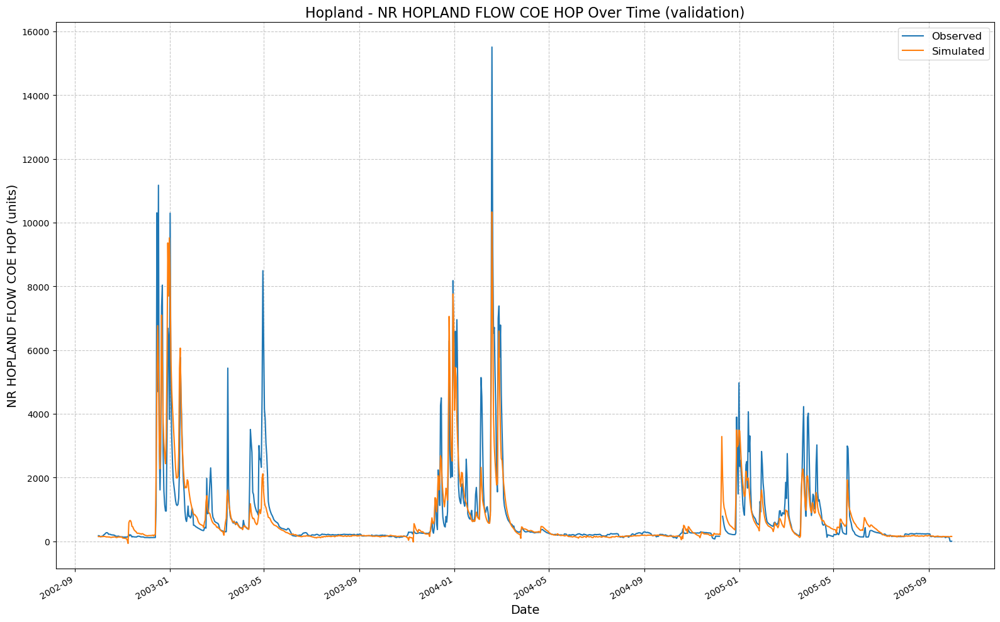

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185707\results_output_validation.csv


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [15]:
if not skip_best_model_validation:
    lstmNoPhysicsValBest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_no_physics_params,
        input_features=None,
        physics_informed=False,
        physics_data_file=None,
        hourly=False,
        extend_train_period=False,
        gpu=gpuSetting
    )
    lstmNoPhysicsValBest.train()
    no_physics_val_csv, no_physics_val_metrics = lstmNoPhysicsValBest.results()
    no_physics_val_metrics

[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:57:35,468: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185735\output.log initialized.
2025-04-16 18:57:35,468: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185735
2025-04-16 18:57:35,468: ### Run configurations for testing_run
2025-04-16 18:57:35,468: experiment_name: testing_run
2025-04-16 18:57:35,484: train_basin_file: hopland
2025-04-16 18:57:35,484: validation_basin_file: hopland
2025-04-16 18:57:35,484: test_basin_file: hopland
2025-04-16 18:57:35,484: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:57:35,484: train_end_date: 2002-09-30 00:00:00
2025-04-16 18:57:35,484: validation_start_date: 2002-10-01 00:00:00
2025-04-16 18:57:35,484: validation_end_date: 2005-09-30 00:00:00
2025-04-16 18:57:35,484: test_start_date: 2005-10-01 00:00:00
2025-04-16 18:57:35,500: test_end_date: 2009-09-29 00:00:00
2025-04-16 18:57

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]
2025-04-16 18:58:07,278: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185735\validation\model_epoch032\validation_metrics.csv
2025-04-16 18:58:07,357: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185735\validation\model_epoch032\validation_results.p
got predictions


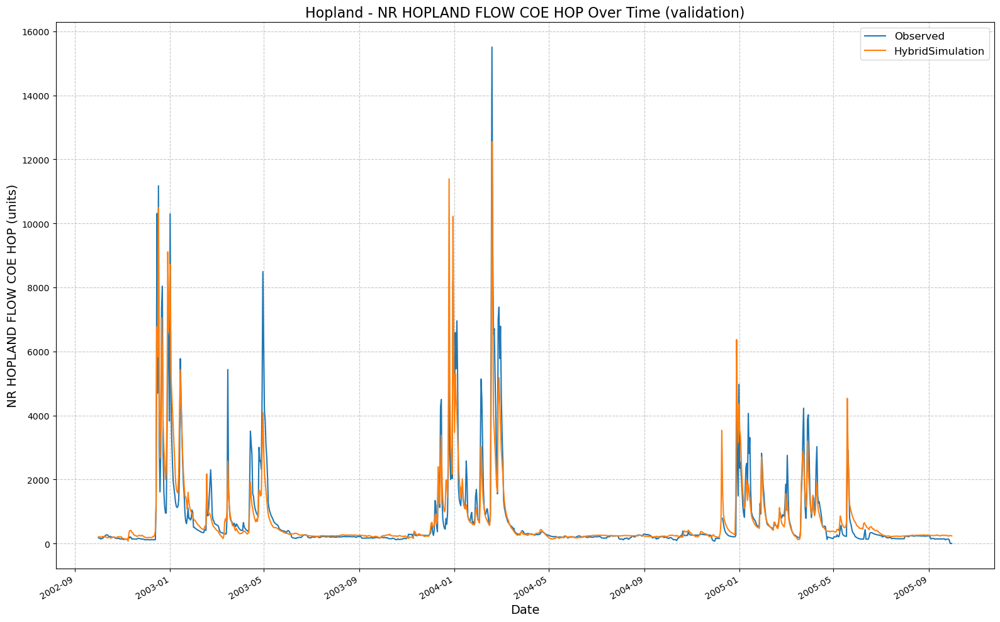

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185735\results_output_validation.csv


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [16]:
if not skip_best_model_validation:
    lstmPhysicsValBest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_physics_params,
        input_features=features_with_physics,
        physics_informed=True,
        physics_data_file=path_to_physics_data,
        hourly=False,
        extend_train_period=False,
        gpu=gpuSetting
    )
    lstmPhysicsValBest.train()
    physics_val_csv, physics_val_metrics = lstmPhysicsValBest.results()
    physics_val_metrics

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future ver

[INFO] Wrote metrics CSV: hopland_daily_subbasins_val_metrics.csv
[INFO] Saved figure: hopland_daily_subbasins_val_model_comparison.png


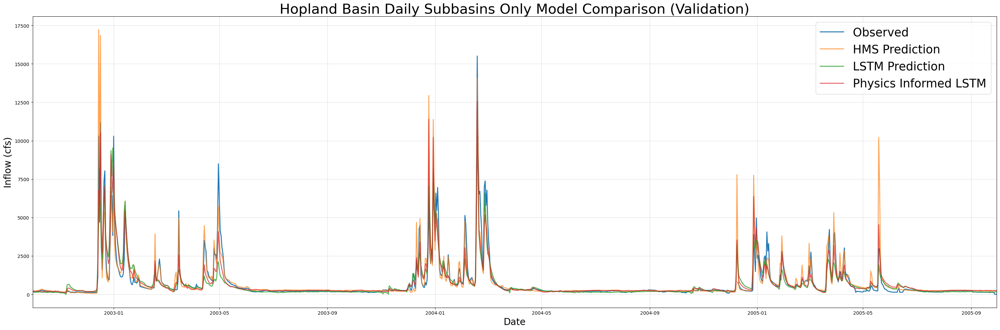

In [17]:
if not skip_best_model_validation:
    combinedPlot(
        lstm_results=no_physics_val_csv,
        lstmPhysics_results=physics_val_csv,
        HMS_results=path_to_physics_data,
        title="Hopland Basin Daily Subbasins Only Model Comparison (Validation)",
        fName="hopland_daily_subbasins_val_metrics.csv",
        plot_filename="hopland_daily_subbasins_val_model_comparison.png",
        timeseries_filename ="hopland_daily_subbasins_val_combined_ts.csv"
    )
else:
    combined_df = pd.read_csv("hopland_daily_subbasins_val_combined_ts.csv")
    combinedPlotFromDf(combined_df, title="Hopland Basin Daily Subbasins Only Model Comparison (Validation)", fName="hopland_daily_subbasins_val_metrics.csv")

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future ver

[INFO] Wrote metrics CSV: hopland_daily_subbasins_val_metrics.csv


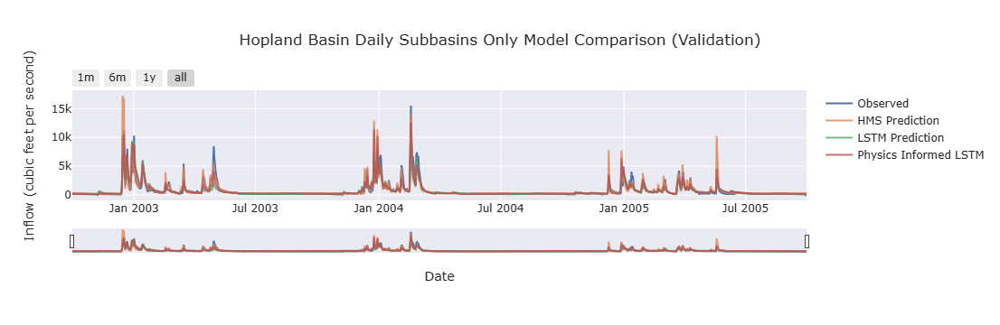

In [18]:
if not skip_best_model_validation:
    fancyCombinedPlot(
        lstm_results=no_physics_val_csv,
        lstmPhysics_results=physics_val_csv,
        HMS_results=path_to_physics_data,
        title='Hopland Basin Daily Subbasins Only Model Comparison (Validation)',
        fName="hopland_daily_subbasins_val_metrics.csv", 
        timeseries_filename ="hopland_daily_subbasins_val_combined_ts.csv"
    )
else:
    fancyCombinedPlotFromDf(combined_df, title="Hopland Basin Daily Subbasins Only Model Comparison (Validation)", fName="hopland_daily_subbasins_val_metrics.csv")

In [19]:
if skip_best_model_validation:
    val_metrics = pd.read_csv("hopland_daily_subbasins_val_metrics.csv", index_col=0)
    print(val_metrics)

# Re-run testing with the best hyperparameters

[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 18:58:13,792: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\output.log initialized.
2025-04-16 18:58:13,792: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813
2025-04-16 18:58:13,792: ### Run configurations for testing_run
2025-04-16 18:58:13,807: experiment_name: testing_run
2025-04-16 18:58:13,807: train_basin_file: hopland
2025-04-16 18:58:13,807: validation_basin_file: hopland
2025-04-16 18:58:13,807: test_basin_file: hopland
2025-04-16 18:58:13,807: train_start_date: 1994-10-01 00:00:00
2025-04-16 18:58:13,807: train_end_date: 2005-09-30 00:00:00
2025-04-16 18:58:13,807: validation_start_date: 2002-10-01 00:00:00
2025-04-16 18:58:13,807: validation_end_date: 2005-09-30 00:00:00
2025-04-16 18:58:13,807: test_start_date: 2005-10-01 00:00:00
2025-04-16 18:58:13,807: test_end_date: 2009-09-29 00:00:00
2025-04-16 18:58

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]
2025-04-16 19:01:07,420: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:01:07,436: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\validation\model_epoch032\validation_results.p
2025-04-16 19:01:07,476: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]
2025-04-16 19:01:07,941: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\test\model_epoch032\test_metrics.csv
2025-04-16 19:01:07,946: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\test\model_epoch032\test_results.p
2025-04-16 19:01:08,017: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]
2025-04-16 19:01:08,452: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:01:08,455: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\validation\model_epoch032\validation_results.p
2025-04-16 19:01:08,516: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]
2025-04-16 19:01:08,982: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\test\model_epoch032\test_metrics.csv
2025-04-16 19:01:08,985: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\test\model_epoch032\test_results.p
2025-04-16 19:01:09,040: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]
2025-04-16 19:01:09,482: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:01:09,482: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\validation\model_epoch032\validation_results.p
2025-04-16 19:01:09,534: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]
2025-04-16 19:01:10,021: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\test\model_epoch032\test_metrics.csv
2025-04-16 19:01:10,026: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\test\model_epoch032\test_results.p
2025-04-16 19:01:10,102: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]
2025-04-16 19:01:10,598: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:01:10,601: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\validation\model_epoch032\validation_results.p
2025-04-16 19:01:10,677: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]
2025-04-16 19:01:11,202: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\test\model_epoch032\test_metrics.csv
2025-04-16 19:01:11,207: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\test\model_epoch032\test_results.p
2025-04-16 19:01:11,280: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\testing_run_1604_190032\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]
2025-04-16 19:01:11,720: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\testing_run_1604_190032\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:01:11,724: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\testing_run_1604_190032\validation\model_epoch032\validation_results.p
2025-04-16 19:01:11,782: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\testing_run_1604_190032\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]
2025-04-16 19:01:12,295: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\testing_run_1604_190032\test\model_epoch032\test_metrics.csv
2025-04-16 19:01:12,305: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\testing_run_1604_190032\test\model_epoch032\test_results.p
2025-04-16 19:01:12,365: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]
2025-04-16 19:01:12,848: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:01:12,852: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\validation\model_epoch032\validation_results.p
2025-04-16 19:01:12,883: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]
2025-04-16 19:01:13,342: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:01:13,342: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\validation\model_epoch032\validation_results.p
2025-04-16 19:01:13,395: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]
2025-04-16 19:01:13,877: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:01:13,879: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\validation\model_epoch032\validation_results.p
2025-04-16 19:01:13,936: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]
2025-04-16 19:01:14,357: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:01:14,357: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\validation\model_epoch032\validation_results.p
2025-04-16 19:01:14,428: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\testing_run_1604_190032\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]
2025-04-16 19:01:14,928: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\testing_run_1604_190032\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:01:14,931: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\testing_run_1604_190032\validation\model_epoch032\validation_results.p
Loading results for each run.


100%|██████████| 5/5 [00:00<00:00, 93.61it/s]


Combining results and calculating metrics.


100%|██████████| 1/1 [00:00<00:00, 34.82it/s]

got predictions


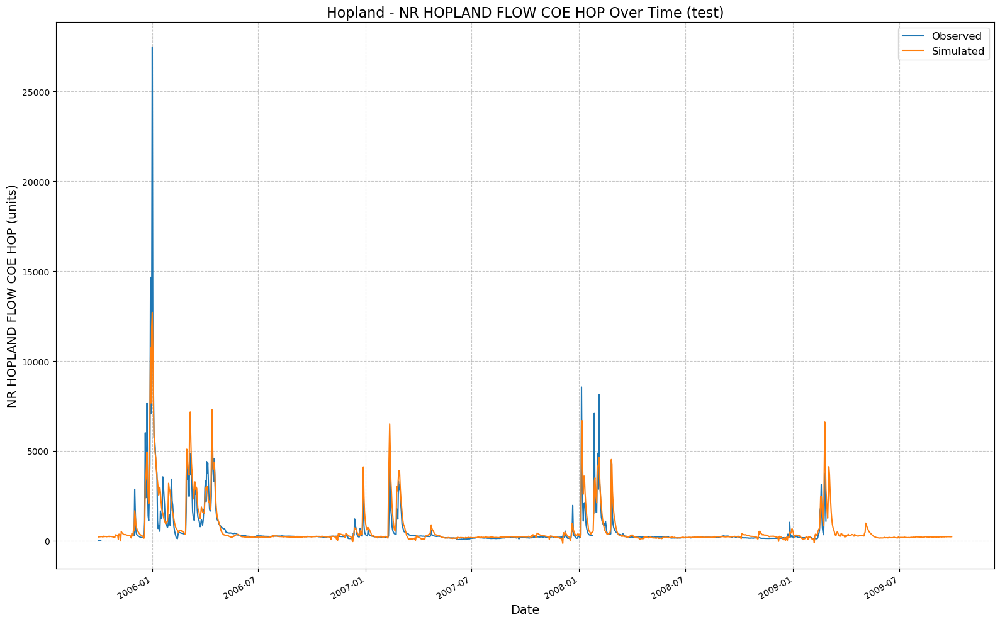

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_185813\testing_run_1604_185849\testing_run_1604_185923\testing_run_1604_185957\testing_run_1604_190032\results_output_test.csv


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.



In [21]:
if not skip_best_model_test:
    hoplandNoPhysicsExtBest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,  
        hyperparams=best_no_physics_params,
        input_features=None,
        physics_informed=False,
        physics_data_file=None,
        hourly=False,
        extend_train_period=True, 
        num_ensemble_members = testEnsembles,
        gpu=gpuSetting
    )
    
    hoplandNoPhysicsExtBest.train()
    no_physics_test_csv, no_physics_test_metrics = hoplandNoPhysicsExtBest.results('test')
    no_physics_test_metrics

[UCB Trainer] Using CUDA device: 'cuda:0'
2025-04-16 19:01:15,726: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\output.log initialized.
2025-04-16 19:01:15,726: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115
2025-04-16 19:01:15,726: ### Run configurations for testing_run
2025-04-16 19:01:15,726: experiment_name: testing_run
2025-04-16 19:01:15,726: train_basin_file: hopland
2025-04-16 19:01:15,742: validation_basin_file: hopland
2025-04-16 19:01:15,742: test_basin_file: hopland
2025-04-16 19:01:15,742: train_start_date: 1994-10-01 00:00:00
2025-04-16 19:01:15,742: train_end_date: 2005-09-30 00:00:00
2025-04-16 19:01:15,749: validation_start_date: 2002-10-01 00:00:00
2025-04-16 19:01:15,751: validation_end_date: 2005-09-30 00:00:00
2025-04-16 19:01:15,754: test_start_date: 2005-10-01 00:00:00
2025-04-16 19:01:15,755: test_end_date: 2009-09-29 00:00:00
2025-04-16 19:01

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]
2025-04-16 19:04:48,967: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:04:48,967: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\validation\model_epoch032\validation_results.p
2025-04-16 19:04:49,061: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]
2025-04-16 19:04:49,748: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\test\model_epoch032\test_metrics.csv
2025-04-16 19:04:49,757: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\test\model_epoch032\test_results.p
2025-04-16 19:04:49,893: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]
2025-04-16 19:04:50,686: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:04:50,689: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\validation\model_epoch032\validation_results.p
2025-04-16 19:04:50,758: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]
2025-04-16 19:04:51,576: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\test\model_epoch032\test_metrics.csv
2025-04-16 19:04:51,582: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\test\model_epoch032\test_results.p
2025-04-16 19:04:51,694: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]
2025-04-16 19:04:52,364: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:04:52,366: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\validation\model_epoch032\validation_results.p
2025-04-16 19:04:52,454: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]
2025-04-16 19:04:53,150: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\test\model_epoch032\test_metrics.csv
2025-04-16 19:04:53,154: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\test\model_epoch032\test_results.p
2025-04-16 19:04:53,264: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]
2025-04-16 19:04:54,009: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:04:54,011: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\validation\model_epoch032\validation_results.p
2025-04-16 19:04:54,075: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]
2025-04-16 19:04:54,941: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\test\model_epoch032\test_metrics.csv
2025-04-16 19:04:54,941: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\test\model_epoch032\test_results.p
2025-04-16 19:04:55,045: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\testing_run_1604_190405\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]
2025-04-16 19:04:55,842: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\testing_run_1604_190405\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:04:55,848: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\testing_run_1604_190405\validation\model_epoch032\validation_results.p
2025-04-16 19:04:55,930: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\testing_run_1604_190405\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]
2025-04-16 19:04:56,636: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\testing_run_1604_190405\test\model_epoch032\test_metrics.csv
2025-04-16 19:04:56,636: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\testing_run_1604_190405\test\model_epoch032\test_results.p
2025-04-16 19:04:56,714: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]
2025-04-16 19:04:57,341: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:04:57,346: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\validation\model_epoch032\validation_results.p
2025-04-16 19:04:57,452: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]
2025-04-16 19:04:58,217: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:04:58,217: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\validation\model_epoch032\validation_results.p
2025-04-16 19:04:58,318: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]
2025-04-16 19:04:59,016: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:04:59,020: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\validation\model_epoch032\validation_results.p
2025-04-16 19:04:59,082: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]
2025-04-16 19:04:59,784: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:04:59,789: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\validation\model_epoch032\validation_results.p
2025-04-16 19:04:59,873: Using the model weights from F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\testing_run_1604_190405\model_epoch032.pt


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]
2025-04-16 19:05:00,561: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\testing_run_1604_190405\validation\model_epoch032\validation_metrics.csv
2025-04-16 19:05:00,564: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\testing_run_1604_190405\validation\model_epoch032\validation_results.p
Loading results for each run.


100%|██████████| 5/5 [00:00<00:00, 113.04it/s]


Combining results and calculating metrics.


100%|██████████| 1/1 [00:00<00:00, 52.65it/s]

got predictions


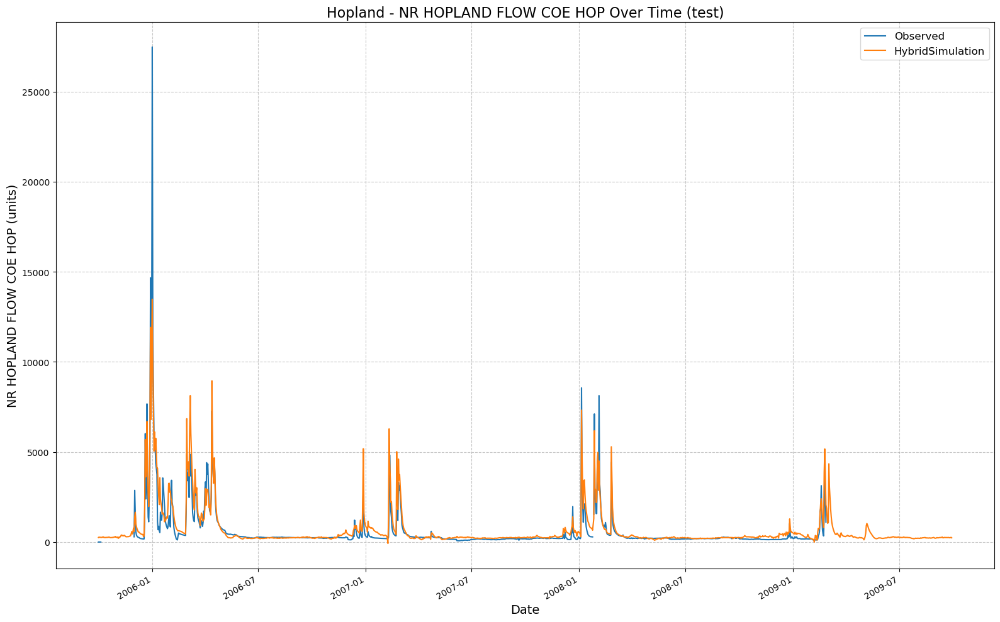

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1604_190115\testing_run_1604_190159\testing_run_1604_190241\testing_run_1604_190324\testing_run_1604_190405\results_output_test.csv


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.



In [22]:
if not skip_best_model_test:
    hoplandPhysicsExtBest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,  
        hyperparams=best_physics_params,
        input_features=features_with_physics,
        physics_informed=True,
        physics_data_file=path_to_physics_data,
        hourly=False,
        extend_train_period=True,
        num_ensemble_members = testEnsembles,
        gpu=gpuSetting
    )
    
    hoplandPhysicsExtBest.train()
    physics_test_csv, physics_test_metrics = hoplandPhysicsExtBest.results('test')
    physics_test_metrics

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neural

[INFO] Wrote metrics CSV: hopland_daily_subbasins_test_metrics_TE.csv
[INFO] Saved figure: hopland_daily_subbasins_test_model_comparison_TE.png


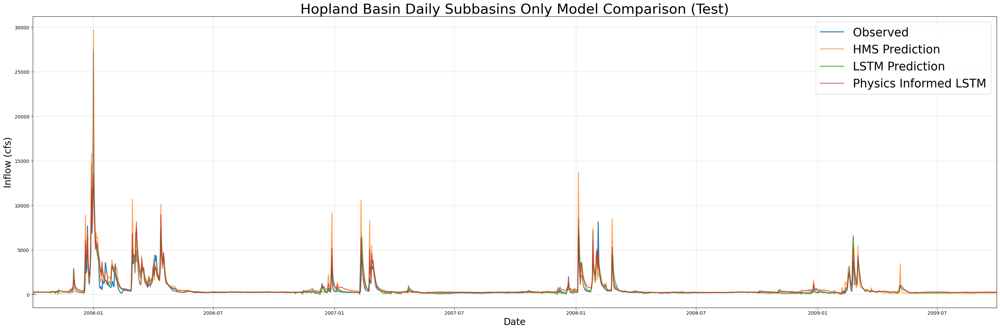

In [23]:
if not skip_best_model_test:
    combinedPlot(
        lstm_results=no_physics_test_csv,
        lstmPhysics_results=physics_test_csv,
        HMS_results=path_to_physics_data,
        title="Hopland Basin Daily Subbasins Only Model Comparison (Test Ensemble)",
        fName="hopland_daily_subbasins_test_metrics_TE.csv",
        plot_filename="hopland_daily_subbasins_test_model_comparison_TE.png", 
        timeseries_filename ="hopland_daily_subbasins_test_combined_TE_ts.csv"
    )
else:
    combined_df = pd.read_csv("hopland_daily_subbasins_test_combined_TE_ts.csv")
    combinedPlotFromDf(combined_df, title="Hopland Basin Daily Subbasins Only Model Comparison (Test Ensemble)", fName="hopland_daily_subbasins_test_metrics_TE.csv")

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\neural

[INFO] Wrote metrics CSV: hopland_daily_subbasins_test_metrics_TE.csv


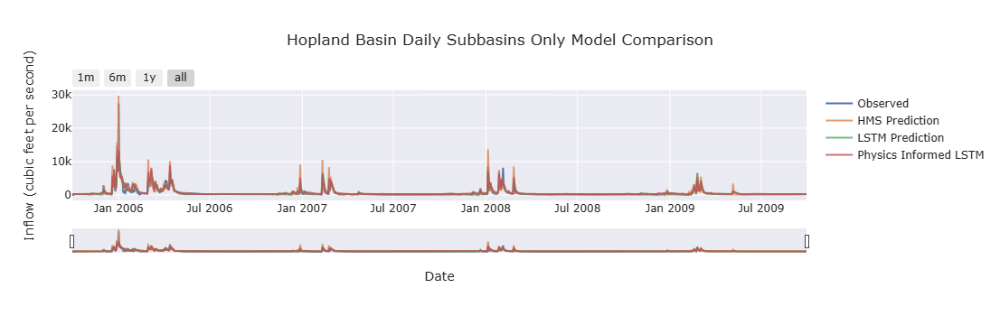

In [24]:
if not skip_best_model_test:
    fancyCombinedPlot(lstm_results=no_physics_test_csv, lstmPhysics_results= physics_test_csv, HMS_results=path_to_physics_data, title='Hopland Basin Daily Subbasins Only Model Comparison (Test Ensemble)', fName = "hopland_daily_subbasins_test_metrics_TE.csv", timeseries_filename ="hopland_daily_subbasins_test_combined_TE_ts.csv")
else:
    fancyCombinedPlotFromDf(combined_df, title="Hopland Basin Daily Subbasins Only Model Comparison (Test Ensemble)", fName="hopland_daily_subbasins_test_metrics_TE.csv")

In [25]:
test_metrics = pd.read_csv("hopland_daily_subbasins_test_metrics_TE.csv", index_col=0)
print(test_metrics)

                       HMS           LSTM  Physics_Informed_LSTM
NSE               0.795548       0.781097               0.810220
MSE          404643.882769  433243.797580          375605.702069
RMSE            636.116249     658.212578             612.866790
KGE               0.728187       0.798888               0.748797
Alpha-NSE         1.186227       0.907388               0.909186
Beta-KGE          1.185632       1.137406               1.214009
Beta-NSE          0.079942       0.059174               0.092163
Pearson-r         0.931134       0.886033               0.904838
FHV              23.945896      -8.769089              -5.952167
FMS              30.814334      21.901515              30.445912
FLV              95.333285     -27.939591             -31.150049
Peak-Timing       0.250000       0.250000               0.250000
Peak-MAPE        36.378148      37.824210              27.035049
PBIAS           -18.563179     -13.740623             -21.400932
